In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from pandas.plotting import scatter_matrix
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode,  plot
from plotly.graph_objs import *
from sklearn import preprocessing

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject#       5875 non-null   int64  
 1   age            5875 non-null   int64  
 2   sex            5875 non-null   int64  
 3   test_time      5875 non-null   float64
 4   Jitter(%)      5875 non-null   float64
 5   Jitter(Abs)    5875 non-null   float64
 6   Jitter:RAP     5875 non-null   float64
 7   Jitter:PPQ5    5875 non-null   float64
 8   Jitter:DDP     5875 non-null   float64
 9   Shimmer        5875 non-null   float64
 10  Shimmer(dB)    5875 non-null   float64
 11  Shimmer:APQ3   5875 non-null   float64
 12  Shimmer:APQ5   5875 non-null   float64
 13  Shimmer:APQ11  5875 non-null   float64
 14  Shimmer:DDA    5875 non-null   float64
 15  NHR            5875 non-null   float64
 16  HNR            5875 non-null   float64
 17  RPDE           5875 non-null   float64
 18  DFA     

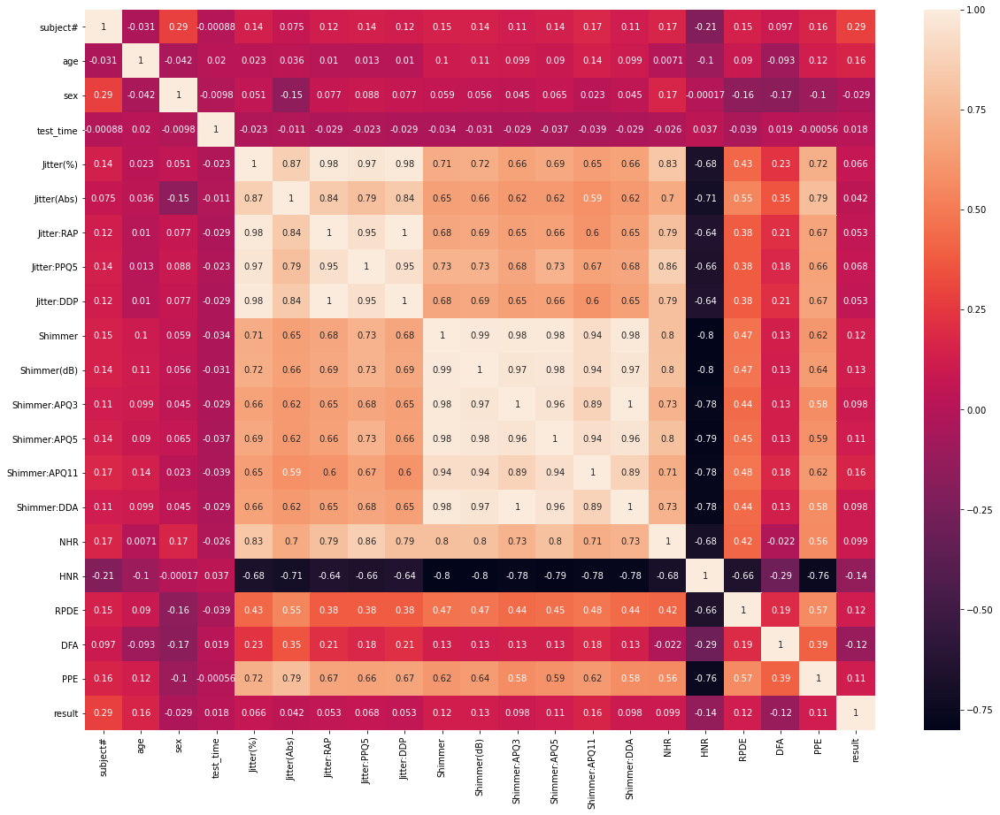

C:\Users\aste\Anaconda3\envs\python37\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



AxesSubplot(0.863095,0.125;0.0369048x0.0359524)


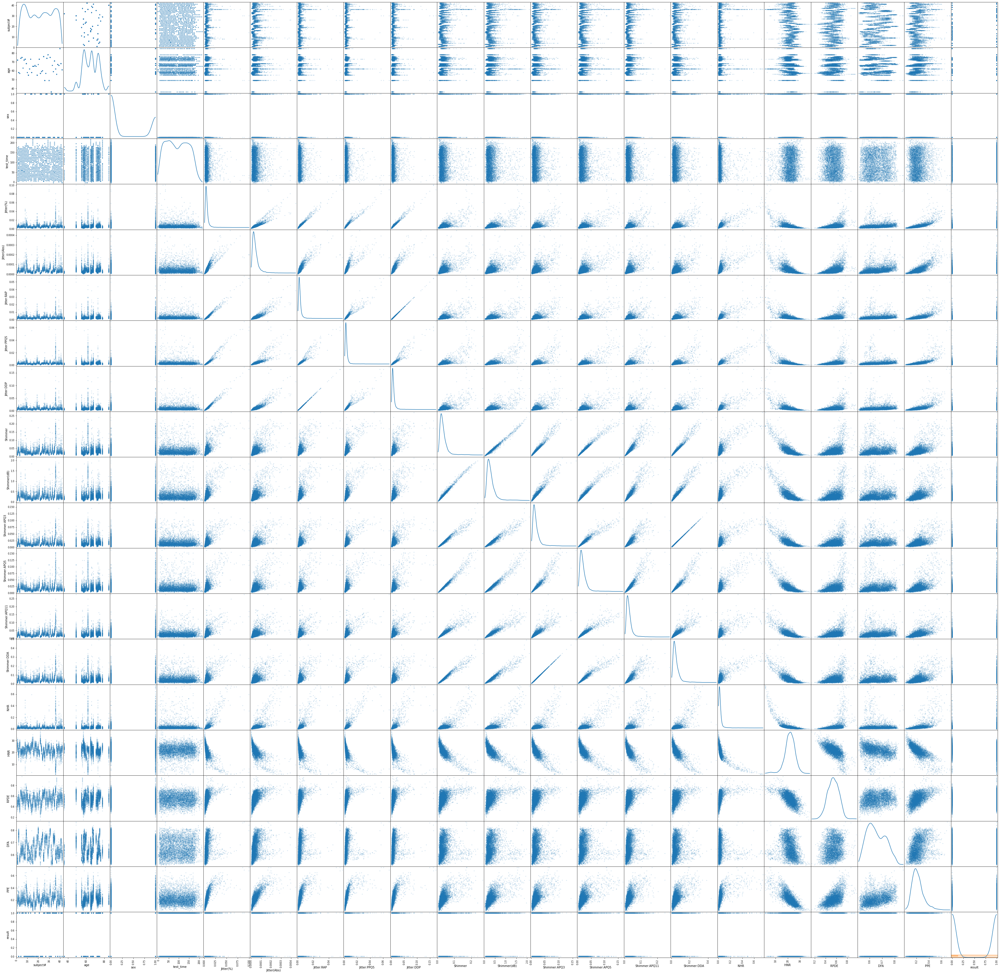

In [2]:
dataset = pd.read_csv(r"C:\ml\parkinsondataset.csv") #read the dataset

dataset.info() # get info of the dataset
dataset.describe()

plt.figure(figsize=(20,15))
sns.heatmap(dataset.corr(), annot=True)
plt.show()
correlations = dataset.corr()# visualize heatmap of the correlations
scatter_matrix(dataset, alpha = 0.2, figsize=(60,60), diagonal = 'kde') # Visualize all correlations with plots
print(sns.distplot(dataset))# Visualize all distributions with plot

In [3]:
#check distrinutions of some important features (age and rpde)
dataset.info()
hist_data = [dataset['age']]
group_labels = ['age'] 
fig = ff.create_distplot(hist_data, group_labels)
fig.show()
#plot(fig)
hist_data = [dataset['RPDE']]
group_labels = ['RPDE'] 
fig = ff.create_distplot(hist_data, group_labels)
fig.show()
#plot(fig)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   subject#       5875 non-null   int64  
 1   age            5875 non-null   int64  
 2   sex            5875 non-null   int64  
 3   test_time      5875 non-null   float64
 4   Jitter(%)      5875 non-null   float64
 5   Jitter(Abs)    5875 non-null   float64
 6   Jitter:RAP     5875 non-null   float64
 7   Jitter:PPQ5    5875 non-null   float64
 8   Jitter:DDP     5875 non-null   float64
 9   Shimmer        5875 non-null   float64
 10  Shimmer(dB)    5875 non-null   float64
 11  Shimmer:APQ3   5875 non-null   float64
 12  Shimmer:APQ5   5875 non-null   float64
 13  Shimmer:APQ11  5875 non-null   float64
 14  Shimmer:DDA    5875 non-null   float64
 15  NHR            5875 non-null   float64
 16  HNR            5875 non-null   float64
 17  RPDE           5875 non-null   float64
 18  DFA     

0    50.229787
1    49.770213
Name: result, dtype: float64
class 0: 2951
class 1: 2924


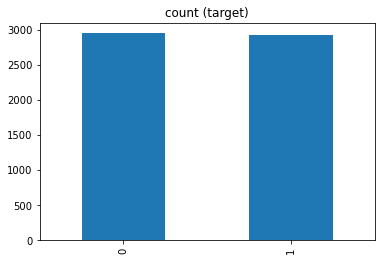

In [4]:
#Check the balance
dependent_analysis = dataset['result'].value_counts(normalize=True) * 100
print(dependent_analysis)

class_count_01, class_count_02 = dataset['result'].value_counts()
dataset['result'].value_counts().plot(kind='bar', title='count (target)')

print('class 0:', class_count_01)
print('class 1:', class_count_02)

In [5]:
y = dataset['result'].values
X = dataset.drop(['result'], axis='columns').values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)  #split data
sc = StandardScaler() #scale data with mean value and standard deviation
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [6]:
#SVM
classifier = SVC(kernel = 'rbf', probability=True)
classifier.fit(X_train, y_train) #train model
y_pred = classifier.predict(X_test) #predict
cm1 = confusion_matrix(y_test, y_pred)
print(cm1)
print(accuracy_score(y_test, y_pred))
report = classification_report(y_test, y_pred) #evaluate
print(report)
print("Training set score: {:.3f}".format(classifier.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier.score(X_test,y_test)))

[[777 124]
 [ 92 770]]
0.8774815655133296
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       901
           1       0.86      0.89      0.88       862

    accuracy                           0.88      1763
   macro avg       0.88      0.88      0.88      1763
weighted avg       0.88      0.88      0.88      1763

Training set score: 0.891
Test set score: 0.877


In [7]:
#Decision Tree
classifier2 = DecisionTreeClassifier(criterion = 'entropy')
classifier2.fit(X_train, y_train) #train model
y_pred = classifier2.predict(X_test)#predict
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
report = classification_report(y_test, y_pred)#evaluate
print(report)
print("Training set score: {:.3f}".format(classifier2.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier2.score(X_test,y_test)))
#Decision tree has overfitting 

[[899   2]
 [  2 860]]
0.9977311401020987
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       901
           1       1.00      1.00      1.00       862

    accuracy                           1.00      1763
   macro avg       1.00      1.00      1.00      1763
weighted avg       1.00      1.00      1.00      1763

Training set score: 1.000
Test set score: 0.998


In [8]:
#kNN
classifier4 = KNeighborsClassifier(n_neighbors = 2, metric = 'minkowski', p = 2)
classifier4.fit(X_train, y_train) #train model
y_pred = classifier4.predict(X_test)#predict
cm = confusion_matrix(y_test, y_pred)
print(cm)
print(accuracy_score(y_test, y_pred))
report = classification_report(y_test, y_pred)#evaluate
print(report)
print("Training set score: {:.3f}".format(classifier4.score(X_train,y_train)))
print("Test set score: {:.3f}".format(classifier4.score(X_test,y_test)))

#kNN has better f1 score, so we choose it

[[855  46]
 [118 744]]
0.9069767441860465
              precision    recall  f1-score   support

           0       0.88      0.95      0.91       901
           1       0.94      0.86      0.90       862

    accuracy                           0.91      1763
   macro avg       0.91      0.91      0.91      1763
weighted avg       0.91      0.91      0.91      1763

Training set score: 0.965
Test set score: 0.907
